**Fraud Detection Model **

Anomaly/Outlier detection is important in a business context in order to prevent fraud and improve security.

**Dataset**


Dataset is availble publically on Kaggle.

The dataset contains transactions made by credit cards in September 2013 by European cardholders.
This dataset presents transactions that occurred in two days, where we have 492 frauds out of 284,807 transactions. The dataset is highly unbalanced, the positive class (frauds) account for 0.172% of all transactions.

Features V1, V2, … V28 are the principal components obtained with PCA, the only features which have not been transformed with PCA are 'Time' and 'Amount'.

Feature 'Time' contains the seconds elapsed between each transaction and the first transaction in the dataset.

The feature 'Amount' is the transaction Amount

Feature 'Class' is the response variable and it takes value 1 in case of fraud and 0 otherwise.

Class: The response variable (0 = no fraud, 1 = fraud)

Import the required libraries to read the data and simple data preprocessing.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np 
import seaborn as sns
df = pd.read_csv('/kaggle/input/creditcardfraud/creditcard.csv')

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


**Analysis Scope:**
* Data Exploration
* Data Visualization
* Feature Selection
* Data Balancing
* Machine Learning Modeling
* Conclusion

**Data Exploration**

Dataset includes a total of 284,807 transactions, of which 492 are fraudulent, representing just 0.17% of the total.

In [2]:
df.shape

(284807, 31)

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

Let's look into the general Statistics of the data

In [4]:
df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,1.168375e-15,3.416908e-16,-1.379537e-15,2.074095e-15,9.604066e-16,1.487313e-15,-5.556467e-16,1.213481e-16,-2.406331e-15,...,1.654067e-16,-3.568593e-16,2.578648e-16,4.473266e-15,5.340915e-16,1.683437e-15,-3.660091e-16,-1.227390e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


In [5]:
#Check Null Values
df.isnull().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

In [6]:
df

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.77,0
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.79,0
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.88,0
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.00,0


In [7]:
df['Class'].value_counts()

0    284315
1       492
Name: Class, dtype: int64

In [8]:
df["Amount"].describe()

count    284807.000000
mean         88.349619
std         250.120109
min           0.000000
25%           5.600000
50%          22.000000
75%          77.165000
max       25691.160000
Name: Amount, dtype: float64

**Data Visualisation**

Lets plot histogram to understand the general distribution of each of the features.

array([[<AxesSubplot: title={'center': 'Time'}>,
        <AxesSubplot: title={'center': 'V1'}>,
        <AxesSubplot: title={'center': 'V2'}>,
        <AxesSubplot: title={'center': 'V3'}>,
        <AxesSubplot: title={'center': 'V4'}>,
        <AxesSubplot: title={'center': 'V5'}>],
       [<AxesSubplot: title={'center': 'V6'}>,
        <AxesSubplot: title={'center': 'V7'}>,
        <AxesSubplot: title={'center': 'V8'}>,
        <AxesSubplot: title={'center': 'V9'}>,
        <AxesSubplot: title={'center': 'V10'}>,
        <AxesSubplot: title={'center': 'V11'}>],
       [<AxesSubplot: title={'center': 'V12'}>,
        <AxesSubplot: title={'center': 'V13'}>,
        <AxesSubplot: title={'center': 'V14'}>,
        <AxesSubplot: title={'center': 'V15'}>,
        <AxesSubplot: title={'center': 'V16'}>,
        <AxesSubplot: title={'center': 'V17'}>],
       [<AxesSubplot: title={'center': 'V18'}>,
        <AxesSubplot: title={'center': 'V19'}>,
        <AxesSubplot: title={'center': 'V20'}

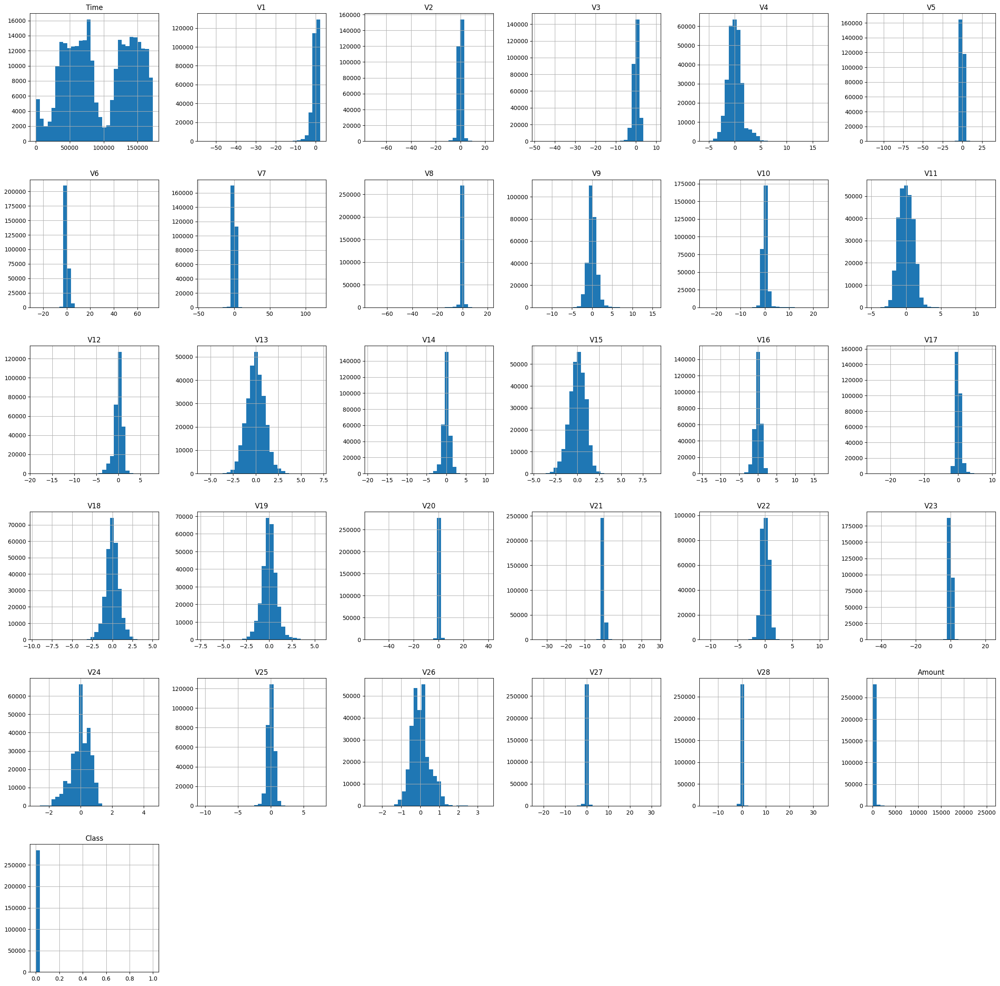

In [9]:
df.hist(bins=30, figsize=(30, 30))

As V1-V28 are PCA, the distribution for each of the features looks reasonably normal.

For Amount, most of the values are less than 250.Average value of the transaction is $88.

For Time,the distribution is quite distorted.

We need to Standardize the data for Amount and Time in the next steps.

For Class, most values are 0.

In [10]:
import plotly.figure_factory as ff
from plotly import tools
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
class_0 = df.loc[df['Class'] == 0]["Time"]
class_1 = df.loc[df['Class'] == 1]["Time"]

hist_data = [class_0, class_1]
group_labels = ['Not Fraud', 'Fraud']

fig = ff.create_distplot(hist_data, group_labels, show_hist=False, show_rug=False)
fig['layout'].update(title='Fraud v/s Not Fraud Transactions over time', xaxis=dict(title='Time [s]'))
iplot(fig, filename='dist_only')

Fraudulent transactions have more even distribution than Mon -Fradulant transactions.

In [11]:
#distribution of values.
import plotly.express as px
fig = px.histogram(
    df,
    x = "Amount",
    nbins = 50
)

fig.show()

In [12]:
import plotly.express as px

fig = px.scatter(
    df,
    y = "Amount",
    color = df["Class"].astype(str),
    hover_data = ["Amount"]
)

fig.update_layout(
       title = "Transaction Amount Distribution"
)

fig.show()

In [13]:
import plotly.express as px

fig = px.scatter(
    df,
    y = "Time",
    color = df["Class"].astype(str),
    hover_data = ["Time"]
)

fig.update_layout(
       title = "Time Distribution"
)

fig.show()

Let's Standardize the columns Time & Amount.

In [14]:
from sklearn.preprocessing import StandardScaler
df[['Time', 'Amount']] = StandardScaler().fit_transform(df[['Time', 'Amount']])
df

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,-1.996583,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,0.244964,0
1,-1.996583,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,-0.342475,0
2,-1.996562,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,1.160686,0
3,-1.996562,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0.140534,0
4,-1.996541,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,-0.073403,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,1.641931,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,-0.350151,0
284803,1.641952,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,-0.254117,0
284804,1.641974,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,-0.081839,0
284805,1.641974,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,-0.313249,0


In [15]:
df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000
mean,-3.065637e-16,1.168375e-15,3.416908e-16,-1.379537e-15,2.074095e-15,9.604066e-16,1.487313e-15,-5.556467e-16,1.213481e-16,-2.406331e-15,...,1.654067e-16,-3.568593e-16,2.578648e-16,4.473266e-15,5.340915e-16,1.683437e-15,-3.660091e-16,-1.227390e-16,2.913952e-17,0.001727
std,1.000002e+00,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,1.000002e+00,0.041527
min,-1.996583e+00,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,-3.532294e-01,0.000000
25%,-8.552120e-01,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,-3.308401e-01,0.000000
50%,-2.131453e-01,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,-2.652715e-01,0.000000
75%,9.372174e-01,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,-4.471707e-02,0.000000
max,1.642058e+00,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,1.023622e+02,1.000000


In [16]:
#distribution of values.
import plotly.express as px
fig = px.histogram(
    df,
    x = "Amount",
    nbins = 20
)

fig.show()

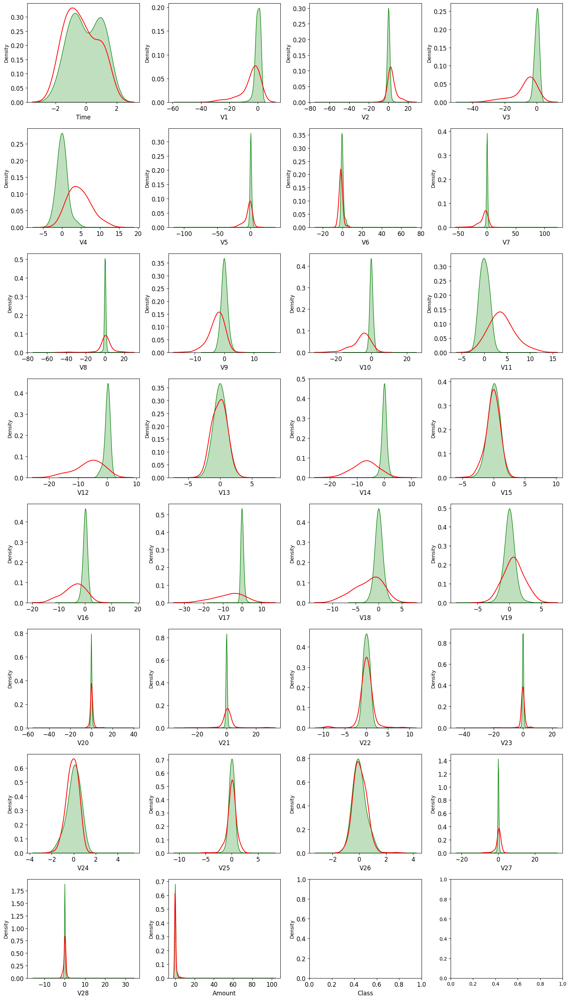

In [17]:
#Boxplot

var = df.columns.values
t0 = df.loc[df['Class'] == 0]
t1 = df.loc[df['Class'] == 1]

num_features = len(var)
num_rows = num_features // 4 + int(num_features % 4 != 0)

fig, ax = plt.subplots(nrows=num_rows, ncols=4, figsize=(16, 28))

for idx, feature in enumerate(var):
    row = idx // 4
    col = idx % 4
    
    sns.kdeplot(t0[feature], bw_method=0.5, label="Class = 0 No-Fraud", color='green', fill=True, warn_singular=False, ax=ax[row, col])
    sns.kdeplot(t1[feature], bw_method=0.5, label="Class = 1 Fraud", color='red', warn_singular=False, ax=ax[row, col])
    
    ax[row, col].set_xlabel(feature, fontsize=12)
    ax[row, col].tick_params(axis='both', which='major', labelsize=12)

   
    
plt.tight_layout()
plt.show()


**Observations on Data**

Data is highly imbalanced with most cases being no fraud.Balancing the dataset is highly crucial for a good model.

Lets study the features of the data more closely.

**Feature Selection**
Lets plot correlation matrix.

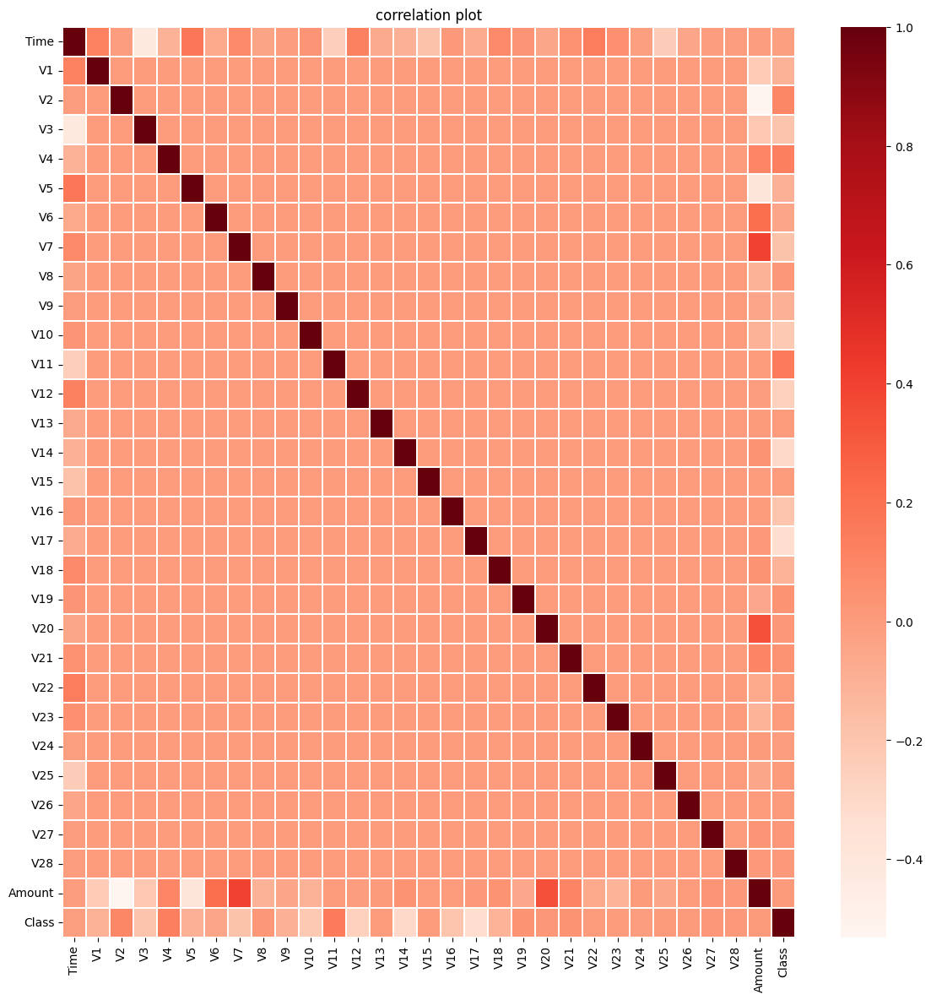

In [18]:
#Correlation
plt.figure(figsize = (14,14))
plt.title('correlation plot')
corr = df.corr()
sns.heatmap(corr,xticklabels=corr.columns,yticklabels=corr.columns,linewidths=.1,cmap="Reds")
plt.show()

There is no significant correlation between the variables V1-V28. 
Features Amount,Time and Class seem to be correlated with some of the features. Lets look into the results more closely.
We will plot the separate plots for features correlating with these 3 features.

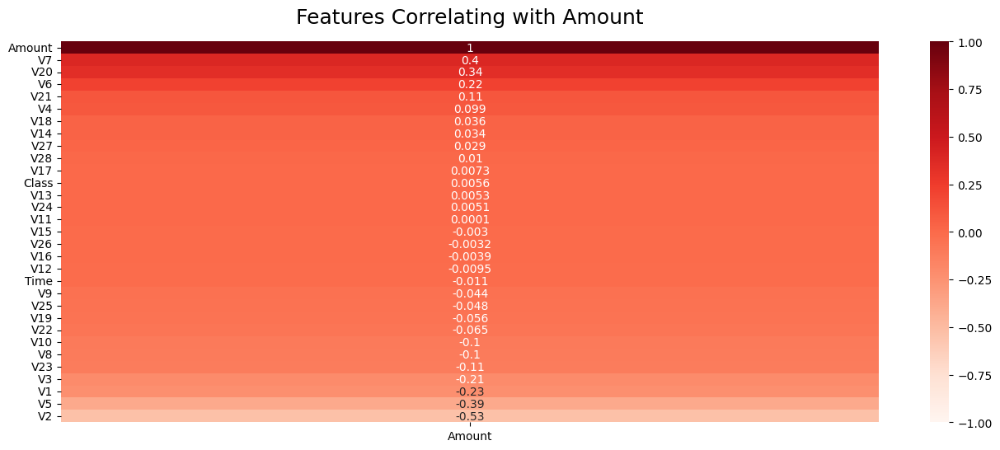

In [19]:
plt.figure(figsize=(16,6))
heatmap = sns.heatmap(df.corr()[['Amount']].sort_values(by='Amount', ascending=False), vmin=-1, vmax=1, annot=True, cmap='Reds')
heatmap.set_title('Features Correlating with Amount', fontdict={'fontsize':18}, pad=16);

* Features with +ve Correlation with Amount : V7,V20,V6,V21
* Features with -ve Correlation with Amount: V2,V5,V1

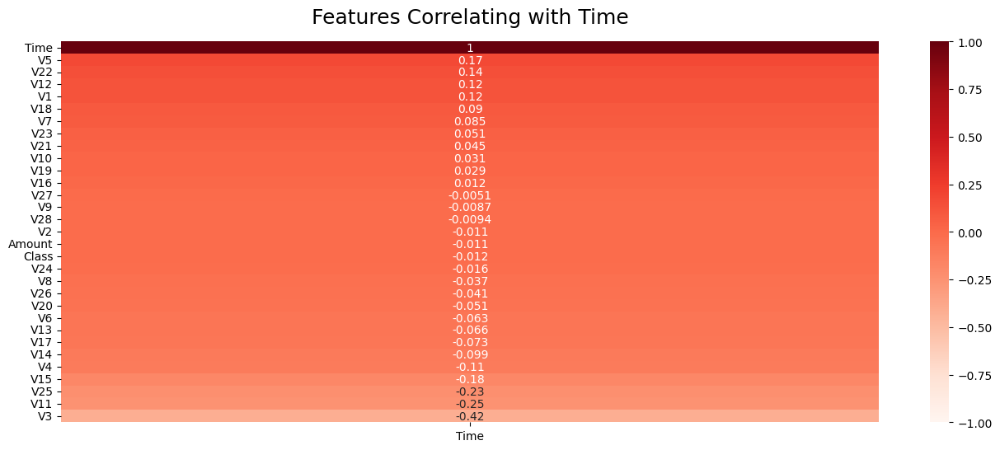

In [20]:
plt.figure(figsize=(16,6))
heatmap = sns.heatmap(df.corr()[['Time']].sort_values(by='Time', ascending=False), vmin=-1, vmax=1, annot=True, cmap='Reds')
heatmap.set_title('Features Correlating with Time', fontdict={'fontsize':18}, pad=16);

* Features with +ve Correlation with Time : V5,V22
* Features with -ve Correlation with Time: V3,V11, V25

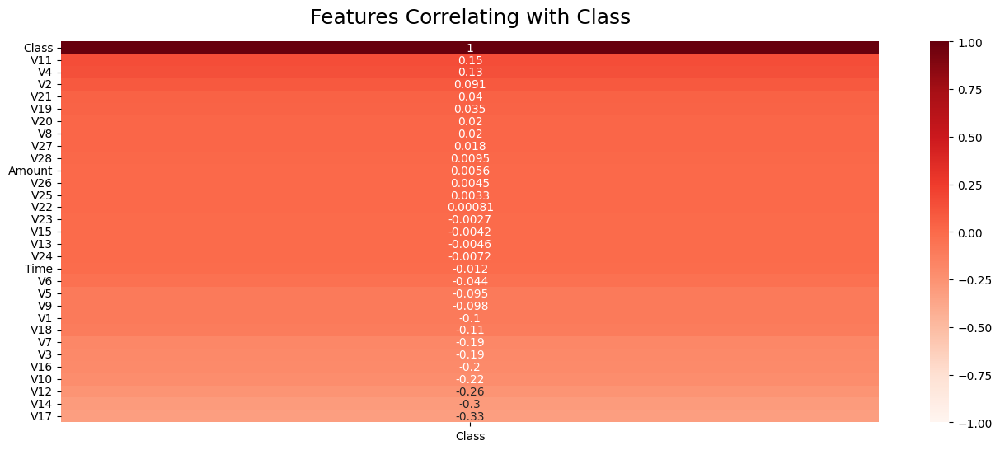

In [21]:
plt.figure(figsize=(16,6))
heatmap = sns.heatmap(df.corr()[['Class']].sort_values(by='Class', ascending=False), vmin=-1, vmax=1, annot=True, cmap='Reds')
heatmap.set_title('Features Correlating with Class', fontdict={'fontsize':18}, pad=16);

* Features with +ve Correlation with Class : V11,V4
* Features with -ve Correlation with Class: V17,V14,V12

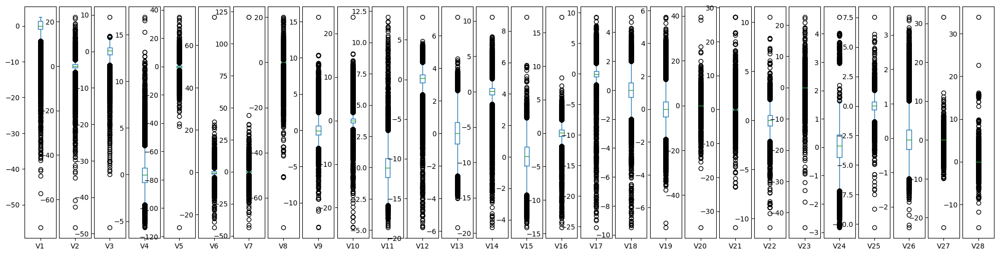

In [22]:
df_new= df.drop(['Class', 'Time', 'Amount'], axis=1)
df_new.plot(
    kind='box', 
    subplots=True, 
    sharey=False, 
    figsize=(25, 6)
)

# increase spacing between subplots
plt.subplots_adjust(wspace=0.1) 
plt.show()

There are some outliers in the data. Lets remove the outliers using Z-score.

In [23]:
from scipy.stats import zscore

# Define a threshold for outlier detection (e.g., 3 standard deviations)
threshold = 3

# Loop through each numerical column in the merged dataset
for col in df.select_dtypes(include=['float']).columns:
    
    # Calculate the z-scores for the column
    zscores = zscore(df[col])
    
    # Create a boolean mask for the outliers
    outliers_mask = abs(zscores) > threshold
    
    # Remove the outliers
    df_clean = df[~outliers_mask]

After removing the outliers, we have 280,731 transactions with 481 Fraud Transactions.

In [24]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 280731 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    280731 non-null  float64
 1   V1      280731 non-null  float64
 2   V2      280731 non-null  float64
 3   V3      280731 non-null  float64
 4   V4      280731 non-null  float64
 5   V5      280731 non-null  float64
 6   V6      280731 non-null  float64
 7   V7      280731 non-null  float64
 8   V8      280731 non-null  float64
 9   V9      280731 non-null  float64
 10  V10     280731 non-null  float64
 11  V11     280731 non-null  float64
 12  V12     280731 non-null  float64
 13  V13     280731 non-null  float64
 14  V14     280731 non-null  float64
 15  V15     280731 non-null  float64
 16  V16     280731 non-null  float64
 17  V17     280731 non-null  float64
 18  V18     280731 non-null  float64
 19  V19     280731 non-null  float64
 20  V20     280731 non-null  float64
 21  V21     28

In [25]:
df_clean['Class'].value_counts()

0    280250
1       481
Name: Class, dtype: int64

In [26]:
df_clean.shape

(280731, 31)

**Data Modeling**

Lets Split the data into 80:20 training & test subdatasets

In [27]:
from sklearn.model_selection import train_test_split
f1 = df_clean.iloc[:,0:30]
t1 = df_clean['Class']
x_train1, x_test1, y_train1, y_test1 = train_test_split(f1, t1, test_size = 0.20, random_state = 2)

In [28]:
x_train1.shape

(224584, 30)

In [29]:
y_train1.value_counts()

0    224194
1       390
Name: Class, dtype: int64

**Imbalanced Data- SMOTE Oversampling**

Imbalanced classification involves developing predictive models on classification datasets that have a severe class imbalance.
The challenge of working with imbalanced datasets is that most machine learning techniques will ignore, and in turn have poor performance on, the minority class, although typically it is performance on the minority class that is most important.

One approach to addressing imbalanced datasets is to oversample the minority class. The simplest approach involves duplicating examples in the minority class, although these examples don’t add any new information to the model. Instead, new examples can be synthesized from the existing examples. This is a type of data augmentation for the minority class and is referred to as the Synthetic Minority Oversampling Technique, or SMOTE for short.

In [30]:
import imblearn       #library to balance the data
from collections import Counter
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline

In [31]:
#SMOTE Balancing
over = SMOTE(sampling_strategy = 'auto')
under = RandomUnderSampler(sampling_strategy = 'auto')
steps = [('over', over)]
pipeline = Pipeline(steps=steps)
f2, t2 = pipeline.fit_resample(x_train1, y_train1)
Counter(t2)

Counter({0: 224194, 1: 224194})

In [32]:
f2.shape

(448388, 30)

Import the libraries.

In [33]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import RocCurveDisplay
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.metrics import precision_recall_curve

**Model Fitting & Model Evaluation**

We will try different models and will be comparinng these models across different parameters for model evaluations.

Define the funtion 'model' to fit the model, get Cross validation Score, ROCAUC score and ROC AUC Plot.

**ROC AUC Score**-
The ROC AUC score tells us how efficient the model is. The higher the AUC, the better the model's performance at distinguishing between the positive and negative classes. An AUC score of 1 means the classifier can perfectly distinguish between all the Positive and the Negative class points

Define the function 'model evaluation' to get confusion matrix and classification report.

**Confusion matrix**
Confusion matrix is cross tabulation of actuals v/s predictions. It is used in classification problems to assess where errors in the model were made.

**F-score**
F-score is the "harmonic mean" of precision and sensitivity.It considers both false positive and false negative cases and is good for imbalanced datasets.



In [34]:
def model(classifier,x_train,y_train,x_test,y_test):
    
    classifier.fit(x_train,y_train)
    prediction = classifier.predict(x_test)
    cv = RepeatedStratifiedKFold(n_splits = 10,n_repeats = 3,random_state = 1)
    print("Cross Validation Score : ",'{0:.2%}'.format(cross_val_score(classifier,x_train,y_train,cv = cv,scoring = 'roc_auc').mean()))
    print("ROC_AUC Score : ",'{0:.2%}'.format(roc_auc_score(y_test,prediction)))
    RocCurveDisplay.from_estimator(classifier, x_test,y_test)
    plt.title('ROC AUC Plot', fontsize=14)
    plt.show()
    
def model_evaluation(classifier,x_test,y_test):
    
    # Confusion Matrix
    
    cm = confusion_matrix(y_test,classifier.predict(x_test))
    names = ['True Neg','False Pos','False Neg','True Pos']
    counts = [value for value in cm.flatten()]
    percentages = ['{0:.2%}'.format(value) for value in cm.flatten()/np.sum(cm)]
    labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(names,counts,percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cm,annot = labels,cmap = 'Reds',xticklabels=['Not Fraud', 'Fraud'],
            yticklabels=['Not Fraud', 'Fraud'],fmt ='')

    plt.title('Confusion Matrix', fontsize=14)
    plt.show()
      # Classification Report
    print(classification_report(y_test,classifier.predict(x_test)))

In [35]:
# get importance
target = 'Class'
predictors = ['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',\
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19',\
       'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28',\
       'Amount']
def model_imp(classifier):
    tmp = pd.DataFrame({'Feature': predictors, 'Feature importance': classifier.feature_importances_})
    tmp = tmp.sort_values(by='Feature importance',ascending=False)
    plt.figure(figsize = (7,4))
    plt.title('Features importance',fontsize=14)
    s = sns.barplot(x='Feature',y='Feature importance',data=tmp)
    s.set_xticklabels(s.get_xticklabels(),rotation=90)
    plt.show()

**Logistic Regression**

Cross Validation Score :  97.59%
ROC_AUC Score :  82.96%


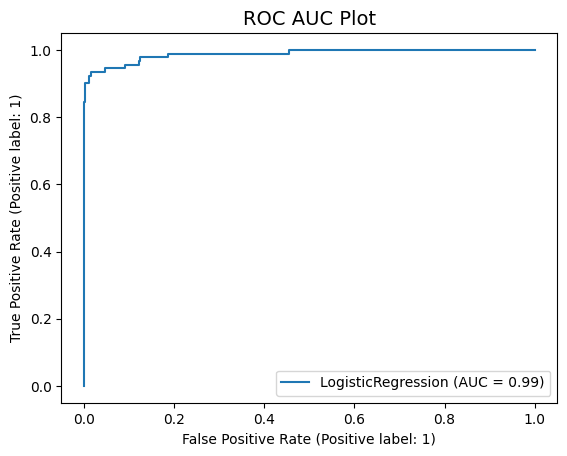

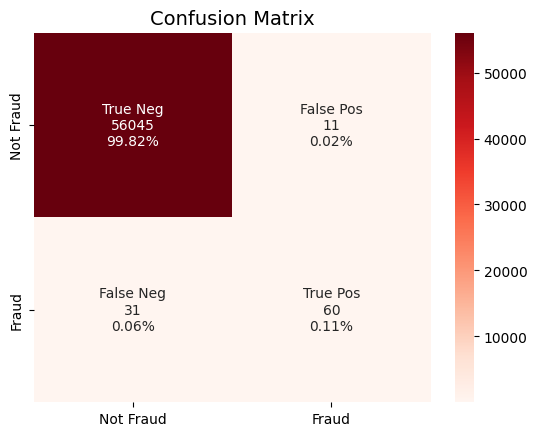

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56056
           1       0.85      0.66      0.74        91

    accuracy                           1.00     56147
   macro avg       0.92      0.83      0.87     56147
weighted avg       1.00      1.00      1.00     56147



In [36]:
#LogisticRegression
from sklearn.linear_model import LogisticRegression
classifier_lr = LogisticRegression(random_state = 0, C=10, penalty= 'l2')
model(classifier_lr,x_train1,y_train1,x_test1,y_test1)
model_evaluation(classifier_lr,x_test1,y_test1)

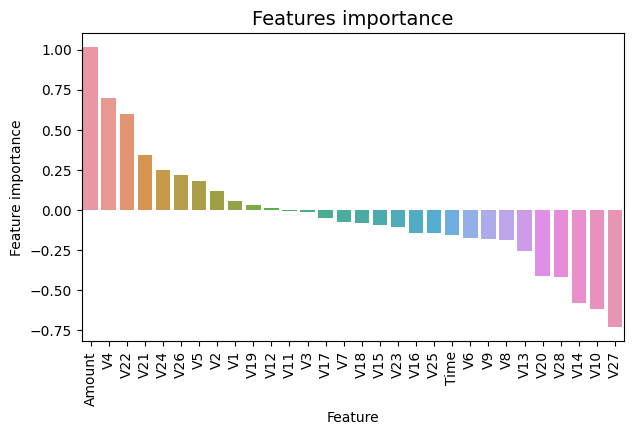

In [37]:
tmp = pd.DataFrame({'Feature': predictors, 'Feature importance': classifier_lr.coef_[0]})
tmp = tmp.sort_values(by='Feature importance',ascending=False)
plt.figure(figsize = (7,4))
plt.title('Features importance',fontsize=14)
s = sns.barplot(x='Feature',y='Feature importance',data=tmp)
s.set_xticklabels(s.get_xticklabels(),rotation=90)
plt.show() 

**Decision Tree**

Decision Trees (DTs) are a non-parametric supervised learning method used for classification and regression. The goal is to create a model that predicts the value of a target variable by learning simple decision rules inferred from the data features. A tree can be seen as a piecewise constant approximation

Advantages of decision trees are:

* Simple to understand and to interpret. Trees can be visualized.
* Requires little data preparation. This module does not support missing values.
* The cost of using the tree (i.e., predicting data) is logarithmic in the number of data points used to train the tree.
* Able to handle both numerical and categorical data. However, the scikit-learn implementation does not support categorical variables for now. Other techniques are usually specialized in analyzing datasets that have only one type of variable. See algorithms for more information.
* Able to handle multi-output problems.
* Uses a white box model. If a given situation is observable in a model, the explanation for the condition is easily explained by boolean logic. By contrast, in a black box model (e.g., in an artificial neural network), results may be more difficult to interpret.
* Possible to validate a model using statistical tests. That makes it possible to account for the reliability of the model.
* Performs well even if its assumptions are somewhat violated by the true model from which the data were generated.

Cross Validation Score :  89.73%
ROC_AUC Score :  91.74%


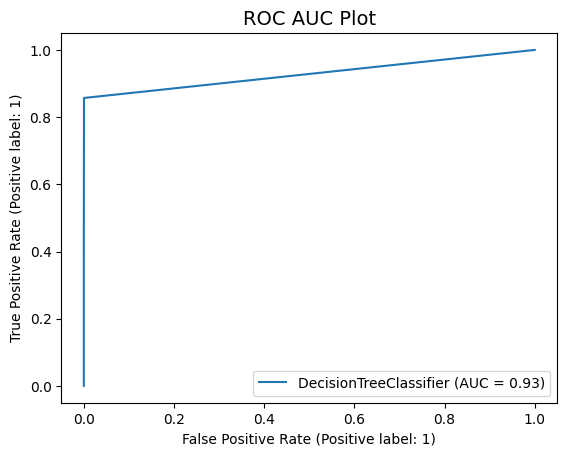

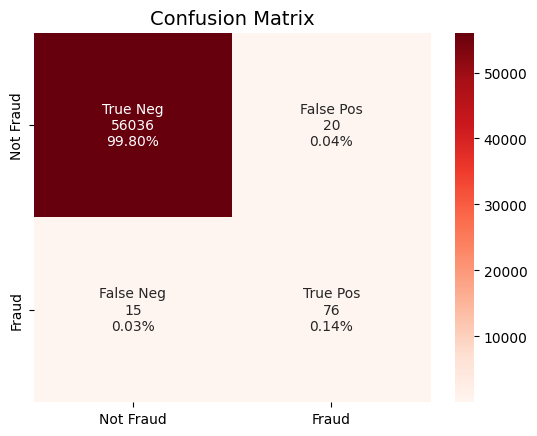

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56056
           1       0.79      0.84      0.81        91

    accuracy                           1.00     56147
   macro avg       0.90      0.92      0.91     56147
weighted avg       1.00      1.00      1.00     56147



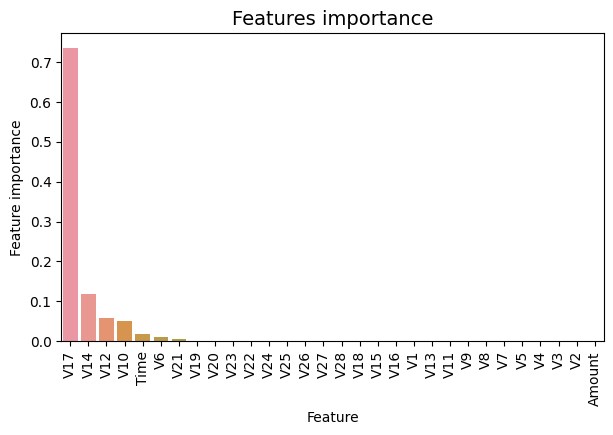

In [38]:
#DecisionTreeClassifier
from sklearn.tree import DecisionTreeClassifier
classifier_dt = DecisionTreeClassifier(random_state = 1000,max_depth = 4,min_samples_leaf = 1)
model(classifier_dt,x_train1,y_train1,x_test1,y_test1)
model_evaluation(classifier_dt,x_test1,y_test1)
model_imp(classifier_dt)

**Support vector machines (SVMs)**

Support vector machines (SVMs) are a set of supervised learning methods used for classification, regression and outliers detection.

The advantages of support vector machines are:
* Effective in high dimensional spaces.
* Still effective in cases where number of dimensions is greater than the number of samples.
* Uses a subset of training points in the decision function (called support vectors), so it is also memory efficient.
* Versatile: different Kernel functions can be specified for the decision function. Common kernels are provided, but it is also possible to specify custom kernels.

Cross Validation Score :  93.69%
ROC_AUC Score :  86.81%


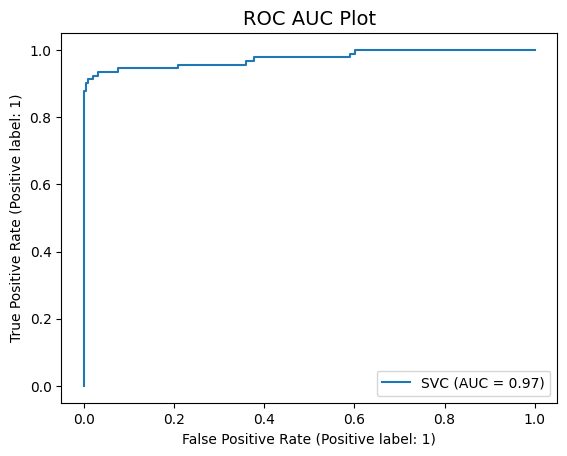

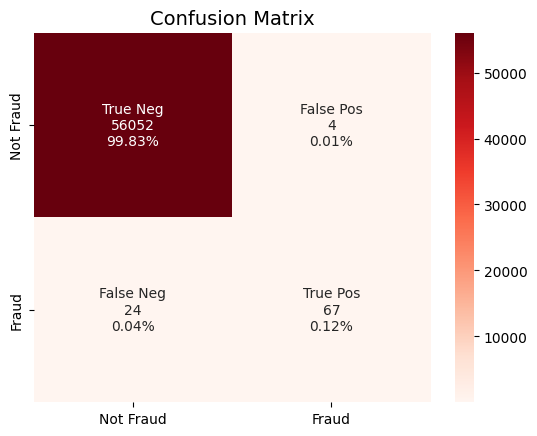

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56056
           1       0.94      0.74      0.83        91

    accuracy                           1.00     56147
   macro avg       0.97      0.87      0.91     56147
weighted avg       1.00      1.00      1.00     56147



AttributeError: 'SVC' object has no attribute 'feature_importances_'

In [39]:
#Support VectorClassifier
from sklearn import svm
classifier_svm = svm.SVC()
model(classifier_svm,x_train1,y_train1,x_test1,y_test1)
model_evaluation(classifier_svm,x_test1,y_test1)
model_imp(classifier_svm)

**K Neighbors Classifier**



Cross Validation Score :  90.42%
ROC_AUC Score :  92.30%


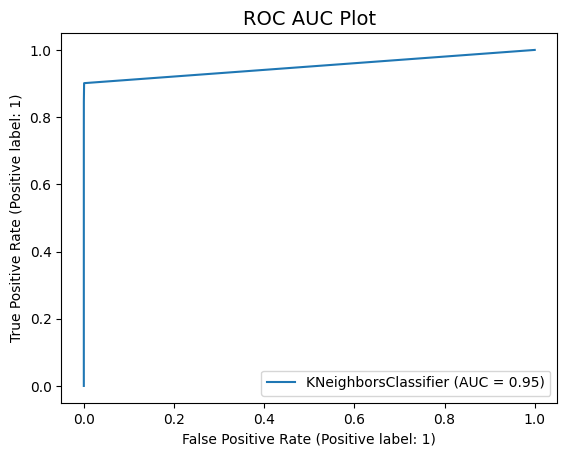

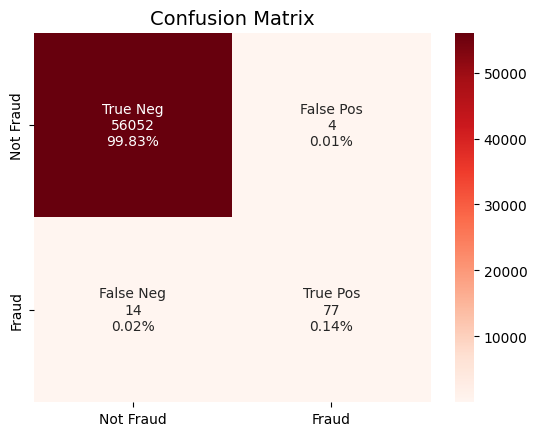

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56056
           1       0.95      0.85      0.90        91

    accuracy                           1.00     56147
   macro avg       0.98      0.92      0.95     56147
weighted avg       1.00      1.00      1.00     56147



AttributeError: 'KNeighborsClassifier' object has no attribute 'feature_importances_'

In [40]:
#KNeighborsClassifier
from sklearn.neighbors import KNeighborsClassifier
classifier_knn = KNeighborsClassifier(leaf_size = 1, n_neighbors = 3,p = 1)
model(classifier_knn,x_train1,y_train1,x_test1,y_test1)
model_evaluation(classifier_knn,x_test1,y_test1)
model_imp(classifier_knn)

**Model Comparison**

Due to this duplication process, we are using synthetic data for modeling purposes to ensure that the predictions are not skewed towards the majority target class value.
hus, evaluating models using accuracy will be misleading. 
Instead, we will go for: confusion matrix, ROC-AUC graph and ROC-AUC score for model evaluation.


**ML Models Results Table:**

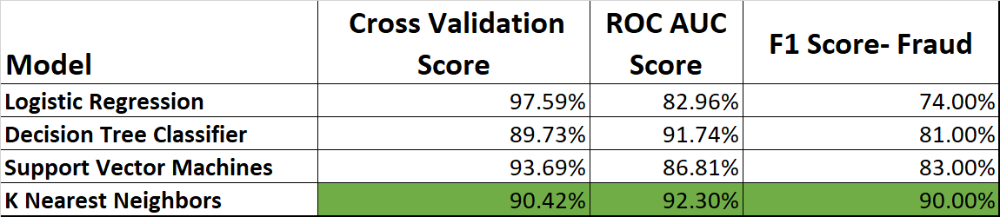


**Conclusion**

Based on the multiple evaluation metrics, we can go with the model K-Nearest Neighbors.

**Recommendations**

* This is a good example of the business challenges for a data scientist on the job.
* The data is highly imbalanced. Different other techniques can also be applied for the problem to overcome the issue.The models trained on this synthetic data cannot be evaluated using accuracy. Hence, we used Cross Validation Score and ROC-AUC Score for model evaluation.
* Data contains the confidential features V1-V28.Feature selection is based only on Statistical tests. In real life, feature selection will be more efficient with business understanding and domain knowledge
* Other Machine learning models can also be used to predict the Fraudulant activity
